## Plotly Case Study

#### Import Required Libraries

In [37]:
import pandas as pd

import plotly
import plotly.graph_objects as go
from plotly import graph_objs as go
from ipywidgets import widgets
from IPython.display import display


plotly.offline.init_notebook_mode(connected=True)

#### Load the Data

In [38]:
df = pd.read_csv("AB_NYC_2019.csv")

In [39]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,19-10-2018,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,21-05-2019,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,05-07-2019,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,19-11-2018,0.10,1,0


#### Data Summary

Source: Airbnb Host Data

Airbnb, Inc. is an American vacation rental online marketplace company based in San Francisco, California, United States. Airbnb offers arrangement for lodging, primarily homestays, or tourism experiences. The company does not own any of the real estate listings, nor does it host events; it acts as a broker, receiving commissions from each booking.

Content: This data file includes all needed information to find out more about hosts, geographical availability, necessary metrics to make predictions and draw conclusions.


#### Columns Description
|   Column            |Description        |
| ------------- |:-------------:|
| id      | listing ID             |
| name      |name of the listing      |    |
| host_id      | host ID      |     |
| host_name      | name of the host      |     |
| neighbourhood_group      |location      |   "  |
| neighbourhood      | area     |     |
| latitude      | latitude coordinates     |     |
| longitude      |longitude coordinates      |     |
| room_type      |listing space type      |     |
| price      |      |price in dollars     |
| minimum_nights      |amount of nights minimum      |     |
| number_of_reviews      |number of reviews      |     |
| last_review      |latest review      |     |
| reviews_per_month      |number of reviews per month      |     |
| calculated_host_listings_count      |amount of listing per host      |     |
| availability_365      |number of days when listing is available for booking      |     |


#### EDA

In [40]:
df.shape

(48895, 16)

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [42]:
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


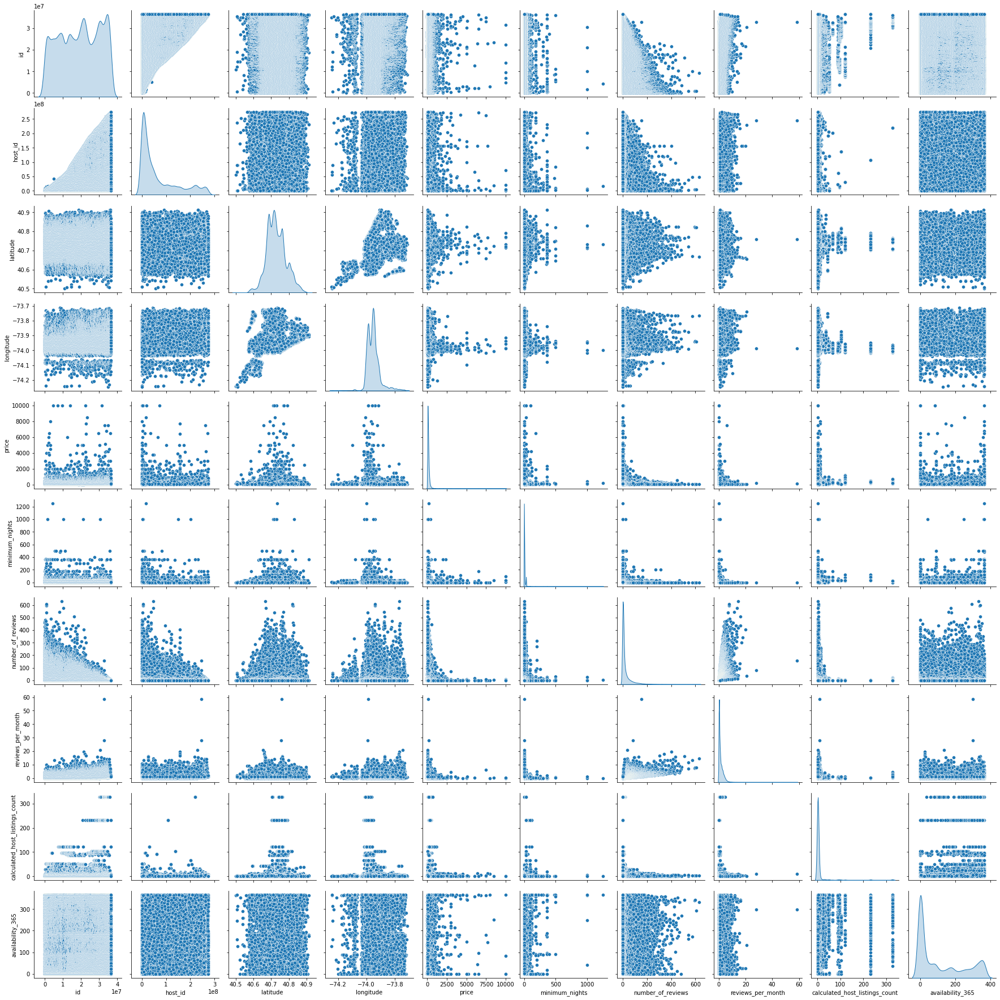

In [43]:
from matplotlib import pyplot as plt
import seaborn as sns
sns.pairplot(df,diag_kind='kde')

#### Unique Values in the Data Columns 

In [44]:
df.nunique()

id                                48895
name                              47896
host_id                           37457
host_name                         11452
neighbourhood_group                   5
neighbourhood                       221
latitude                          19048
longitude                         14718
room_type                             3
price                               674
minimum_nights                      109
number_of_reviews                   394
last_review                        1764
reviews_per_month                   937
calculated_host_listings_count       47
availability_365                    366
dtype: int64

#### Room Type Distribution

In [45]:
df_room_type = df[['room_type','id']].groupby(['room_type']).count().reset_index()
df_room_type.columns = ['room_type','count']

df_room_type['percent'] = (df_room_type['count']/df_room_type['count'].sum())*100

In [46]:
df_room_type

,room_type,count,percent
0,Entire home/apt,25409,51.966459
1,Private room,22326,45.661111
2,Shared room,1160,2.372431


In [47]:
data = [go.Bar(
   x = df_room_type['room_type'],
   y = df_room_type['percent']
)]

fig = go.Figure(data=data)
fig.update_layout(xaxis_title="Room Type",yaxis_title="Percent of Listings")
fig.show()

#### Neighbourhood Group Distribution

In [48]:
df_ne_grp = df[['neighbourhood_group','id']].groupby(['neighbourhood_group']).count().reset_index()
df_ne_grp.columns = ['neighbourhood_group','count']

df_ne_grp['percent'] = (df_ne_grp['count']/df_ne_grp['count'].sum())*100

df_ne_grp

,neighbourhood_group,count,percent
0,Bronx,1091,2.231312
1,Brooklyn,20104,41.116679
2,Manhattan,21661,44.301053
3,Queens,5666,11.588097
4,Staten Island,373,0.762859


In [49]:
data = [go.Bar(
   x = df_ne_grp['neighbourhood_group'],
   y = df_ne_grp['percent']
)]

fig = go.Figure(data=data)
fig.update_layout(xaxis_title="Neighbourhood Group",yaxis_title="Percent of Listings")
fig.show()

##### Following lets see the Room Type Contribution with in each Neighbourhood Groups


In [50]:
df_ne_rm_grp = df[['neighbourhood_group','room_type','id']].groupby(['neighbourhood_group','room_type']).count().reset_index()
df_ne_rm_grp.columns = ['neighbourhood_group','room_type','count_ng_rm']


df_ne_rm_grp = df_ne_rm_grp.merge(df_ne_grp[['neighbourhood_group','count']],how='inner',\
                                  left_on='neighbourhood_group',right_on='neighbourhood_group')

df_ne_rm_grp['percent_grp'] = (df_ne_rm_grp['count_ng_rm']/df_ne_rm_grp['count'])*100

df_ne_rm_grp

,neighbourhood_group,room_type,count_ng_rm,count,percent_grp
0,Bronx,Entire home/apt,379,1091,34.738772
1,Bronx,Private room,652,1091,59.761687
2,Bronx,Shared room,60,1091,5.499542
3,Brooklyn,Entire home/apt,9559,20104,47.547752
4,Brooklyn,Private room,10132,20104,50.397931
5,Brooklyn,Shared room,413,20104,2.054318
6,Manhattan,Entire home/apt,13199,21661,60.934398
7,Manhattan,Private room,7982,21661,36.849638
8,Manhattan,Shared room,480,21661,2.215964
9,Queens,Entire home/apt,2096,5666,36.992587


In [51]:
ne_grp = df_ne_rm_grp['neighbourhood_group'].unique()
print(ne_grp)

rm_grp = df_ne_rm_grp['room_type'].unique()
print(rm_grp)

['Bronx' 'Brooklyn' 'Manhattan' 'Queens' 'Staten Island']
['Entire home/apt' 'Private room' 'Shared room']


In [52]:
fig = go.Figure(data=[
    go.Bar(name=rm_grp[0], x = ne_grp, y = df_ne_rm_grp[df_ne_rm_grp['room_type'] == rm_grp[0]]['percent_grp']),
    go.Bar(name=rm_grp[1], x = ne_grp, y = df_ne_rm_grp[df_ne_rm_grp['room_type'] == rm_grp[1]]['percent_grp']),
    go.Bar(name=rm_grp[2], x = ne_grp, y = df_ne_rm_grp[df_ne_rm_grp['room_type'] == rm_grp[2]]['percent_grp']),
])
# Change the bar mode
fig.update_layout(barmode='stack',xaxis_title="Neighbourhood Group - Stacked with Room Type"\
                  ,yaxis_title="Percent of Listings")
fig.show()

#### Distribution of Mininimum Nights of Stay

In [53]:
df['minimum_nights'].describe(percentiles = [0.25,0.35,0.40,0.5,0.80,0.9,0.99])

count    48895.000000
mean         7.029962
std         20.510550
min          1.000000
25%          1.000000
35%          2.000000
40%          2.000000
50%          3.000000
80%          6.000000
90%         28.000000
99%         45.000000
max       1250.000000
Name: minimum_nights, dtype: float64

In [54]:
data = [go.Histogram(x = df[df['minimum_nights']<=45]['minimum_nights'])]
fig = go.Figure(data)
fig.update_layout(xaxis_title="Minimum Nights of Stay",yaxis_title="Number of Listings")
fig.show()

#### Distribution of Calculated Host Listings count

In [55]:
df['calculated_host_listings_count'].describe(percentiles = [0.5,0.80,0.9,0.94,0.95,0.97,0.99])

count    48895.000000
mean         7.143982
std         32.952519
min          1.000000
50%          1.000000
80%          3.000000
90%          5.000000
94%         11.000000
95%         15.000000
97%         49.000000
99%        232.000000
max        327.000000
Name: calculated_host_listings_count, dtype: float64

In [56]:
data = [go.Histogram(x = df[df['calculated_host_listings_count']<=5]['calculated_host_listings_count'])]
fig = go.Figure(data)
fig.update_layout(xaxis_title="Calculated Host Listings",yaxis_title="Number of Listings")
fig.show()

#### Correlation Between the Numeric Features

In [57]:
corr_cols = ['price','minimum_nights','number_of_reviews','reviews_per_month',\
  'calculated_host_listings_count','availability_365']

df_corr = df[corr_cols]

corr = df_corr.corr()

In [58]:
fig = go.Figure(data=go.Heatmap(
                    z=corr,
                    x=corr_cols,
                    y=corr_cols))
fig.update_layout(title_text='Analysing Correlation between the features with HeatMap')
fig.show()

In [59]:
import plotly.express as px
px.parallel_coordinates(df_corr)

#### Understanding the Range of the Price - Using Box Plot

In [60]:
fig = go.Figure()
fig.add_trace(go.Box(y=df['number_of_reviews'], name='Number of Reviews',
                marker_color = 'indianred'))

fig.show()

In [61]:
fig = go.Figure()
fig.add_trace(go.Box(y=df['price'], name='Price',
                marker_color = 'indianred'))

fig.show()

#### Price vs Number of Review 

In [62]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=df['price'], y=df['number_of_reviews'],
                    mode='markers',
                    name='markers'))

fig.update_layout(
    title="Price vs Number of Review",
    xaxis_title="Price",
    yaxis_title="Number of Reviews",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="RebeccaPurple"
    )
)

fig.show()

#### 3-Dim Plot of Price vs Minimum Nights of Stay vs Number of Reviews

In [ ]:
fig = go.Figure()
fig = go.Figure(data=[go.Mesh3d(x=df['price'],y=df['minimum_nights'],z=df['number_of_reviews'],
                   opacity=0.5,
                   color='rgba(244,22,100,0.6)'
                  )])
# Update plot sizing
fig.update_layout(
scene = dict(
    xaxis_title='Price',
    yaxis_title='Minimum Nights',
    zaxis_title='Number of Reviews'), 
    width=700,
    height=800,
    autosize=False,
    margin=dict(r=20, l=10, b=10, t=10),
    template="plotly_white",
)

# Update 3D scene options
fig.update_scenes(
    aspectratio=dict(x=1, y=1, z=1),
    aspectmode="manual"
)
fig.show()

#### Drop Down - Neighbourhood Group Price Variations

In [ ]:
df['neighbourhood_group'].unique()

In [63]:
# Initialize figure
fig = go.Figure()

# Add Traces

fig.add_trace(
    go.Violin(y=list(df[df['neighbourhood_group'] == 'Brooklyn']['price'].reindex()),
               name="Brooklyn",
               line=dict(color="#33CFA5")))

fig.add_trace(
    go.Violin(y=list(df[df['neighbourhood_group'] == 'Manhattan']['price'].reindex()),
               name="Manhattan",
               line=dict(color="#F06A6A")))

fig.add_trace(
    go.Violin(y=list(df[df['neighbourhood_group'] == 'Queens']['price'].reindex()),
               name="Queens",
               line=dict(color="#AA0DFE")))

fig.add_trace(
    go.Violin(y=list(df[df['neighbourhood_group'] == 'Staten Island']['price'].reindex()),
               name="Staten Island",
               line=dict(color="#565656")))

fig.add_trace(
    go.Violin(y=list(df[df['neighbourhood_group'] == 'Bronx']['price'].reindex()),
               name="Bronx",
               line=dict(color="#0099C6")))



fig.update_layout(
    updatemenus=[
        dict(
            active=0,
            buttons=list([
                dict(label="All",
                     method="update",
                     args=[{"visible": [True,True,True,True,True]},
                           {"title": "Price Variations"}]),
                dict(label="Brooklyn",
                     method="update",
                     args=[{"visible": [True,False,False,False,False]},
                           {"title": "Brooklyn Price"}]),
                dict(label="Manhattan",
                     method="update",
                     args=[{"visible": [False,True,False,False,False]},
                           {"title": "Manhattan Price"}]),
                dict(label="Queens",
                     method="update",
                     args=[{"visible": [False,False,True,False,False]},
                           {"title": "Queens Price"}]),
                dict(label="Staten Island",
                     method="update",
                     args=[{"visible": [False,False,False,True,False]},
                           {"title": "Staten Island Price"}]),
                dict(label="Bronx",
                     method="update",
                     args=[{"visible": [False,False,False,False,True]},
                           {"title": "Bronx Price"}]),


            ]),
        )
    ])

# Set title and labels
fig.update_layout(title_text="Price Distribution by Neighbourhood Group",xaxis_title="Neighbourhood Group")

fig.show()


In [ ]:
df['room_type'].unique()

In [ ]:
# Initialize figure
fig = go.Figure()

df_room_type = df[df['price']<2000]

# Add Traces

fig.add_trace(
    go.Box(y=list(df_room_type[df_room_type['room_type'] == 'Entire home/apt']['price'].reindex()),
               name="Entire home/apt",
               line=dict(color="#33CFA5")))

fig.add_trace(
    go.Box(y=list(df_room_type[df_room_type['room_type'] == 'Private room']['price'].reindex()),
               name="Private room",
               line=dict(color="#F06A6A")))

fig.add_trace(
    go.Box(y=list(df_room_type[df_room_type['room_type'] == 'Shared room']['price'].reindex()),
               name="Shared room",
               line=dict(color="#AA0DFE")))



fig.update_layout(
    updatemenus=[
        dict(
            active=0,
            buttons=list([
                dict(label="All",
                     method="update",
                     args=[{"visible": [True,True,True]},
                           {"title": "Price Variations - Room Type"}]),
                dict(label="Entire home/apt",
                     method="update",
                     args=[{"visible": [True,False,False]},
                           {"title": "Entire home/apt Price"}]),
                dict(label="Private room",
                     method="update",
                     args=[{"visible": [False,True,False]},
                           {"title": "Private room Price"}]),
                dict(label="Shared room",
                     method="update",
                     args=[{"visible": [False,False,True]},
                           {"title": "Shared room Price"}]),

            ]),
        )
    ])

# Set title
fig.update_layout(title_text="Price Distribution by Room Type",xaxis_title="Room Type")

fig.show()


#### Visvalize in USA map

In [ ]:
fig = go.Figure(data=go.Scattergeo(
        lon = df['longitude'],
        lat = df['latitude'],
        text = df['name'],
        mode = 'markers'
        ))

fig.update_layout(
        title = 'NYC - Airbnb Listed Properties',
        geo_scope='usa'
    )

fig.show()

In [ ]:
import plotly.express as px 

fig = px.scatter_mapbox(df, lat="latitude", lon="longitude", hover_name="name", hover_data=["number_of_reviews", "price"],
                         zoom=3, height=500,
                         color="neighbourhood_group", color_discrete_sequence=px.colors.qualitative.Antique)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

#### Figure widget

In [ ]:
from ipywidgets import interact
fig = go.FigureWidget()
scatt = fig.add_histogram()

xs = df
@interact(room = df['room_type'].unique(), \
          neighboor = df['neighbourhood_group'].unique(),\
          reviews_grt = (1,100,5),
          min_nights = (1,30,1))

def update(room = 'Private room',neighboor = 'Manhattan', reviews_grt = 5,min_nights=1):
    with fig.batch_update():
        scatt = df[(df['room_type'] == room) \
                   & (df['neighbourhood_group'] == neighboor) \
                   & (df['number_of_reviews'] > reviews_grt) \
                   & (df['minimum_nights'] == min_nights)]['price']
        fig.data[0].x=scatt        

In [ ]:
fig